### Train the thing

In [4]:
import sys
import os
import matplotlib.pyplot as plt
from tqdm import tqdm
import torch
from configmypy import ConfigPipeline, YamlConfig, ArgparseConfig
from dqno.data.data_utils import get_data_loader, get_test_loader, PushForwardDataSet, push_forward
from dqno.models.dqfno import DQFNO
from dqno.losses.custom_losses import MultiTaskLoss
from dqno.losses.data_losses import LpLoss, H1Loss
from scripts.utils import create_run_directory, initialize_model, get_loss_object, plot_and_save_loss

config = {
}

device = 'cpu' if not torch.cuda.is_available() else 'cuda'

train_loader, train_dataset = get_data_loader(
    "/Users/anthonypoole/data/local_dqfno/train/chunked",
    "/Users/anthonypoole/data/local_dqfno/train/chunked",
    batch_size=2,
    shuffle=True,
    num_workers=0,
    device=device,
)
test_loader, test_dataset = get_test_loader(
    "/Users/anthonypoole/data/local_dqfno/train/chunked",
    "/Users/anthonypoole/data/local_dqfno/train/chunked",
    batch_size=2,
    shuffle=False,
    num_workers=0,
    device=device,
)

dx = train_dataset.dx
chunk_size = train_dataset.chunk_size
if dx != test_dataset.dx:
    raise ValueError("Test and train datasets have different dx")

pf = False

model = DQFNO(
    modes=[[8,8],[8,8],[8,8]],
    in_channels=1,
    out_channels=1,
    dx=dx,
    hidden_channels=8,
    n_layers=4,
    derived_module=None,
    
)
optimizer = torch.optim.AdamW(model.parameters(), lr=.001, weight_decay=.01)

selector_state = lambda y_pred, y: (y_pred[0], y[0])
selector_derived = lambda y_pred, y: (y_pred[1], y[1])

losses = []
selectors = []
for loss, weight in zip(['lp'], [1]):
    if loss == 'lp':
        losses.append(LpLoss(d=4, p=2, reduction='mean'))
        selectors.append(selector_state)
    elif loss == 'h1':
        losses.append(H1Loss(d=2))
        selectors.append(selector_state)
    elif loss == 'derived':
        losses.append(torch.nn.MSELoss())
        selectors.append(selector_derived)

loss_obj =  MultiTaskLoss(
    loss_functions=losses,
    scales=[1],
    multi_output=True,
    input_selectors=selectors
)

train_losses, test_losses = [], []
for epoch in range(3):
    running_loss = 0.0
    # Standard training
    for i, (inputs, targets) in tqdm(enumerate(train_loader), desc=f"Training Epoch #{epoch}", total=len(train_loader)):
        inputs, targets = (inputs[0].to(device), inputs[1].to(device)), (targets[0].to(device), targets[1].to(device))
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = loss_obj(outputs, targets)
        loss.backward()
        optimizer.step()
        running_loss += float(loss)

    epoch_train_loss = running_loss / len(train_loader)
    train_losses.append(epoch_train_loss)
    print(f"Epoch #{epoch}: Train Loss: {epoch_train_loss}")

    model.eval()
    test_loss = sum(float(loss_obj(model((inputs[0].to(device), inputs[1].to(device))), (targets[0].to(device), targets[1].to(device)))) for inputs, targets in test_loader) / len(test_loader)
    test_losses.append(test_loss)
    print(f"Epoch #{epoch}: Test Loss: {test_loss}")
    model.train()

run_dir = create_run_directory(config=config)
model.save(run_dir, "model.pth")
plot_and_save_loss(train_losses, test_losses, 3, run_dir)
print("Finished training. Loss plot saved.")

Training Epoch #0: 100%|██████████| 39/39 [11:38<00:00, 17.92s/it]


Epoch #0: Train Loss: 0.9999683147821671
Epoch #0: Test Loss: 0.9999377635809091


Training Epoch #1: 100%|██████████| 39/39 [12:10<00:00, 18.73s/it]


Epoch #1: Train Loss: 0.997172589485462
Epoch #1: Test Loss: 0.9947165388327378


Training Epoch #2: 100%|██████████| 39/39 [13:24<00:00, 20.63s/it]


Epoch #2: Train Loss: 0.9867904446063898
Epoch #2: Test Loss: 0.9867879503812546
Model saved to ./runs/run_20250408_224528/model.pth
Finished training. Loss plot saved.


### Test the Thing

torch.Size([1, 1, 200, 3, 64, 64]) torch.Size([200, 1])


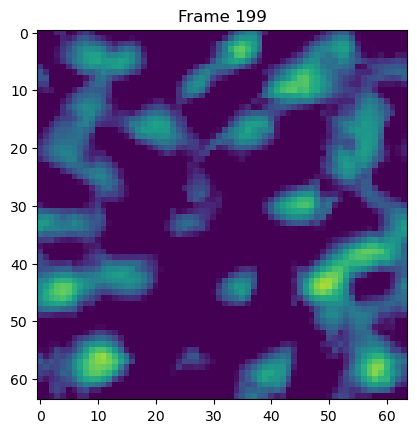

In [5]:
import h5py
from viz import animation 
from IPython.display import HTML

with h5py.File('/Users/anthonypoole/data/local_dqfno/train/hw2d_sim_step0.025_end1_pts512_c11_k015_N3_nu5e-8_20250131125000_1814_2.h5','r') as f:
    density = torch.tensor(f['density'][:chunk_size])
    vort = torch.tensor(f['omega'][:chunk_size])
    phi = torch.tensor(f['phi'][:chunk_size])
    gamma_n = torch.tensor(f['gamma_n'][:chunk_size]).unsqueeze(1)
    state = torch.stack((density,vort,phi)).permute(1,0,2,3).unsqueeze(0).unsqueeze(0)
    print(state.shape, gamma_n.shape)



pred = model((state,gamma_n)).detach().numpy()
pred[0].shape
# fig, ax = plt.subplots(1,2)
# ax[0].imshow(pred[0][0,66,0,:,:])
# ax[1].imshow(pred[0][0,67,0,:,:])

chan = 0
images = [pred[0,0,i,chan,:,:] for i in range(pred.shape[2])]

ani = animation(images)
HTML(ani.to_jshtml())  # Or use ani.to_html5_video() for better quality

### Test Spectral Conv

In [12]:
### Ok lets look at this code
_n_modes = [[8,8],[16,16],[2,2]]
vars = 3
def forward(x):
    # x shape: (B, C, T, V, H, W)
    b, c, t, v, h, w = x.shape
    if v != vars:
        raise ValueError("Mismatch in # of variables vs. n_modes list length.")

    # RFFT along the last two dims
    x_ft = torch.fft.rfft2(x, s=(h, w), dim=(-2, -1))
    # Prepare output in freq domain, same shape
    out_ft = x_ft.clone()  # <--- HERE is the key fix

    # For each variable, apply learned weighting to the “top” and “bottom” slices
    for var_idx in range(vars):
        m1, m2 = _n_modes[var_idx]  # already adjusted for rfft2
        # wpos, wneg = weight[var_idx][0], weight[var_idx][1]

        # positive-slice
        pos_in = x_ft[:, :, :, var_idx, :m1, :m2]
        # out_pos = compl_mul2d(pos_in, wpos)
        # out_ft[:, :, :, var_idx, :m1, :m2] = out_pos
        out_ft[:, :, :, var_idx, :m1, :m2] = pos_in

        # negative-slice
        neg_in = x_ft[:, :, :, var_idx, -m1:, :m2]
        # out_neg = compl_mul2d(neg_in, wneg)
        # out_ft[:, :, :, var_idx, -m1:, :m2] = out_neg
        out_ft[:, :, :, var_idx, -m1:, :m2] = neg_in

    # Inverse FFT
    x_out = torch.fft.irfft2(out_ft, s=(h, w), dim=(-2, -1))
    # if bias is not None:
    #     x_out = x_out + bias.unsqueeze(0).unsqueeze(2)  # broadcast

    return x_out

conved = forward(state)

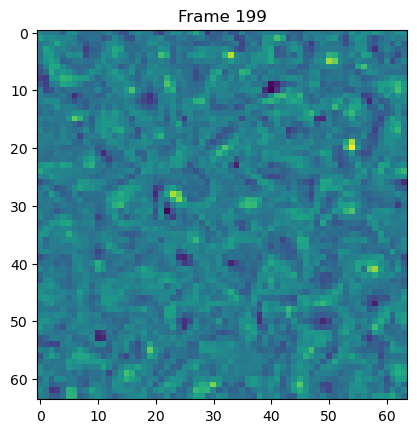

In [ ]:
import h5py
from viz import animation 
from IPython.display import HTML

chan = 1
images = [conved[0,0,i,chan,:,:] for i in range(conved.shape[2])]

ani = animation(images)
HTML(ani.to_jshtml())  # Or use ani.to_html5_video() for better quality

In [ ]:
x = x.reshape(b*v, c, t, h, w)
x_conv = self.conv3ds[index](x)
x_conv = x_conv.reshape(b,c,t,v,h,w)